<a href="https://colab.research.google.com/github/ElaYJ/Study_Deep_Learning/blob/main/DL_Project/YOLOv8_epochs_30.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<br></br>

## YOLO model

In [1]:
!nvcc __version

nvcc fatal   : Don't know what to do with '__version'


In [1]:
!nvidia-smi

Sun May 12 12:12:31 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   47C    P8              13W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 kB 1.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 524, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are {'export', 'train', 'predict', 'val', 'track', 'benchmark'}.

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'classify', 'detect', 'pose', 'segment', 'obb'}
                MODE (required) is one of {'export', 'train', 'predict', 'val', 'track', 'benchmark'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

In [ ]:
import os

def remove_file(fdir, fname):
    rm_path = os.path.join(os.path.join(fdir, fname))
    if os.path.exists(rm_path):
        os.remove(rm_path)
        print(f"{fname} 삭제")
    else:
        print("존재하지 않는 파일")

In [ ]:
pdir = "/content/drive/MyDrive/DLP/YOLO_data/train/labels/"
with open(os.path.join(pdir, "C22_B02_004_483770.txt"), 'r') as f:
    data = f.read()
print(data)

2 0.6714893617 0.3687145558 0.3589598109 0.2832514178
3 0.713534279 0.668979206 0.3764775414 0.2089981096
1 0.3307210402 0.566436673 0.0908983452 0.1641776938
2 0.6714893617 0.3687145558 0.3589598109 0.2832514178
3 0.713534279 0.668979206 0.3764775414 0.2089981096
1 0.3307210402 0.566436673 0.0908983452 0.1641776938
2 0.9124586288 0.3713988658 0.1750827423 0.2481663516


In [ ]:
filename = "C22_B02_005_414895.txt"
remove_file(pdir, filename)

C22_B02_005_414895.txt 삭제


In [ ]:
fdir = "/content/drive/MyDrive/DLP/YOLO_data/train/images"
fname = "C22_B02_005_414895.jpg"
remove_file(fdir, fname)

C22_B02_005_414895.jpg 삭제


In [ ]:
dataset_location = "/content/drive/MyDrive/DLP/YOLO_data"

In [ ]:
os.listdir(dataset_location)

['train', 'valid', 'test', 'data.yaml']

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset_location}/data.yaml epochs=30 imgsz=640

100% 49.7M/49.7M [00:00<00:00, 187MB/s]
Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/DLP/YOLO_data/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

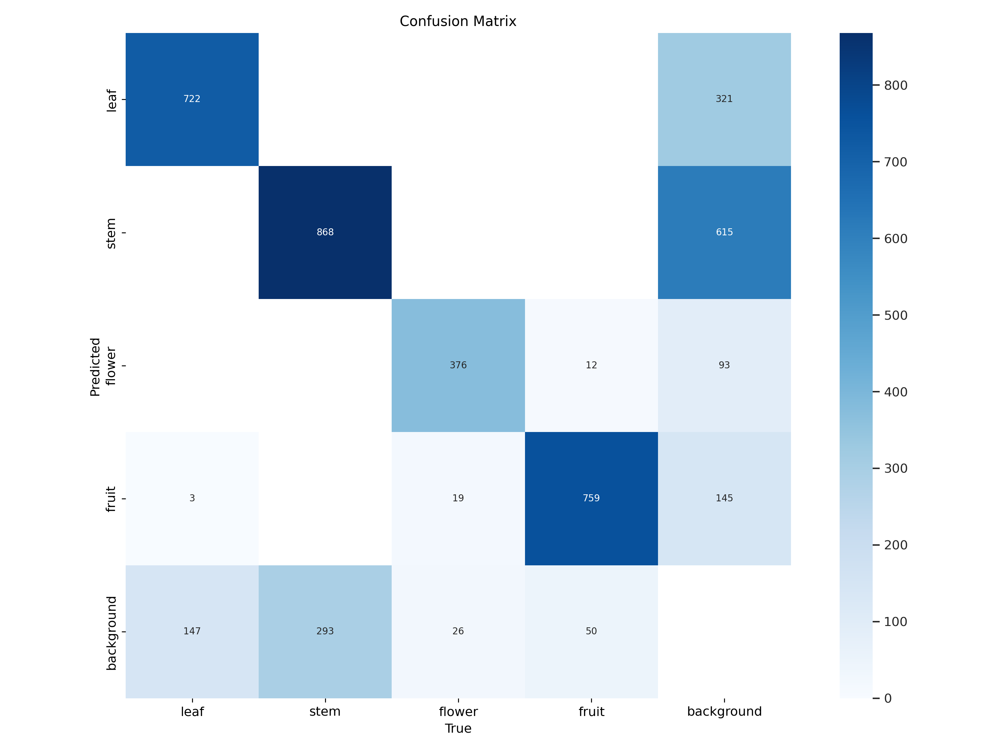

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=700)

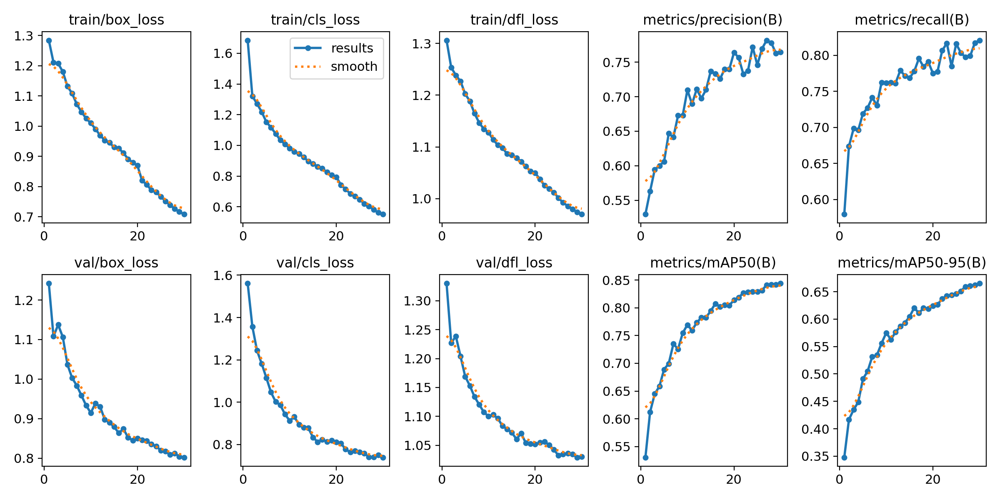

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=1000)

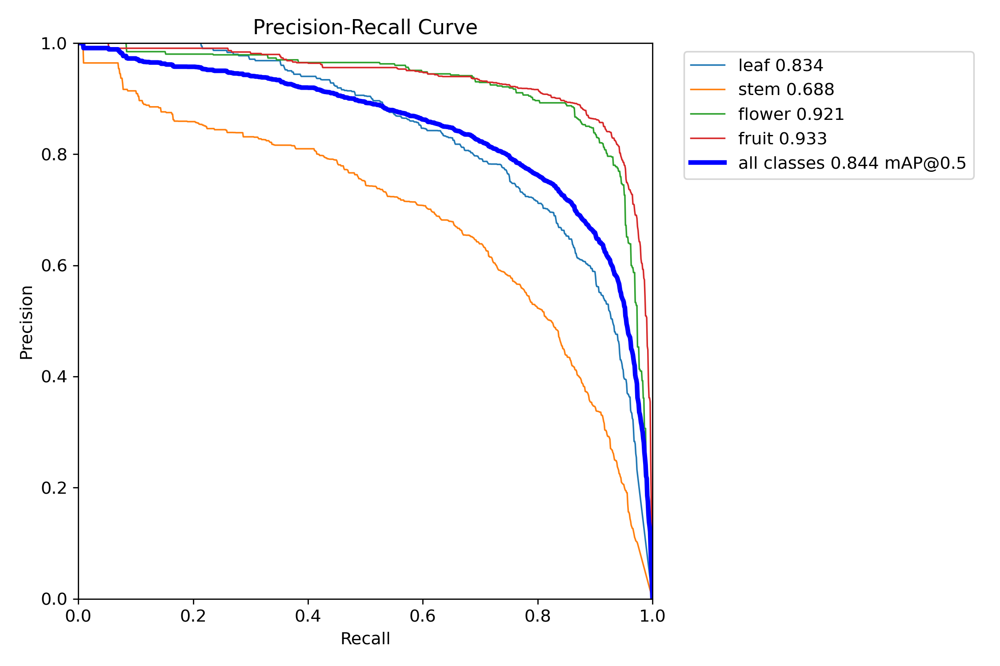

In [ ]:
Image(filename=f'/content/runs/detect/train/PR_curve.png', width=700)

In [ ]:
import pandas as pd

pd.read_csv("/content/runs/detect/train/results.csv")

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.28460,1.68500,1.30600,0.52981,0.57938,0.53048,0.34780,1.24220,1.56150,1.3300,0.000415,0.000415,0.000415
1,2,1.21140,1.32110,1.25330,0.56300,0.67359,0.61212,0.41679,1.10810,1.35750,1.2271,0.000804,0.000804,0.000804
2,3,1.20770,1.27140,1.23840,0.59450,0.69830,0.64491,0.43475,1.13750,1.24410,1.2385,0.001166,0.001166,0.001166
3,4,1.18040,1.21820,1.22660,0.60001,0.69625,0.65846,0.44871,1.10650,1.18190,1.2038,0.001126,0.001126,0.001126
4,5,1.13180,1.15310,1.20230,0.60621,0.71904,0.68903,0.49086,1.03660,1.11540,1.1689,0.001085,0.001085,0.001085
5,6,1.10840,1.11650,1.18830,0.64682,0.72713,0.69954,0.50479,1.00300,1.04660,1.1531,0.001044,0.001044,0.001044
6,7,1.07260,1.07660,1.16460,0.64141,0.74130,0.73500,0.53157,0.98351,1.00190,1.1338,0.001002,0.001002,0.001002
7,8,1.04730,1.03400,1.14660,0.67277,0.73054,0.72571,0.53425,0.95852,0.98611,1.1205,0.000961,0.000961,0.000961
8,9,1.02540,1.00790,1.13450,0.67289,0.76237,0.75459,0.55614,0.93325,0.94282,1.1073,0.000920,0.000920,0.000920
9,10,1.01030,0.98174,1.12810,0.70954,0.76164,0.76941,0.57496,0.91484,0.91228,1.1002,0.000879,0.000879,0.000879


In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset_location}/data.yaml

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/drive/MyDrive/DLP/YOLO_data/valid/labels.cache... 400 images, 0 backgrounds, 0 corrupt: 100% 400/400 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 25/25 [00:23<00:00,  1.06it/s]
                   all        400       3275      0.766       0.82      0.844      0.666
                  leaf        400        872      0.722       0.79      0.833      0.771
                  stem        400       1161      0.657      0.675      0.689      0.477
                flower        400        421      0.833        0.9      0.921      0.687
                 fruit        400        821       0.85      0.916      0.932      0.728
Speed: 1.7ms preprocess, 22.7ms inference, 0.0ms loss, 8.9ms postprocess per image
Results saved to runs/detect/val
💡 Le

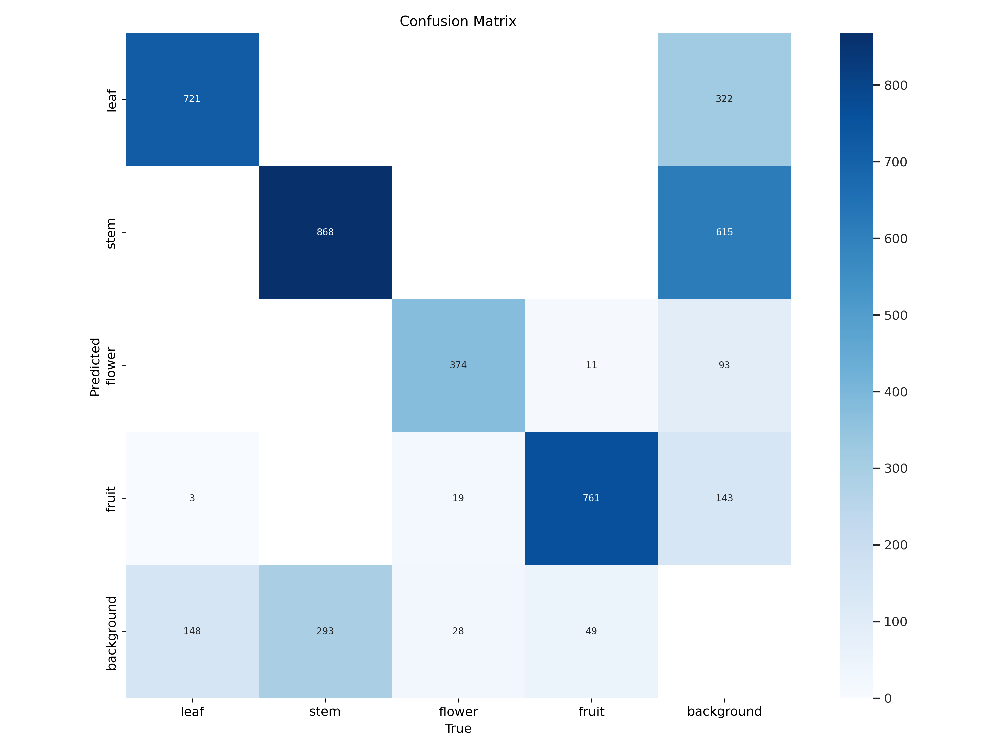

In [ ]:
Image(filename=f'/content/runs/detect/val/confusion_matrix.png', width=700)

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source={dataset_location}/test/images

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs

image 1/76 /content/drive/MyDrive/DLP/YOLO_data/test/images/C22_B02_004_416416.jpg: 640x576 3 leafs, 4 stems, 2 flowers, 1 fruit, 71.7ms
image 2/76 /content/drive/MyDrive/DLP/YOLO_data/test/images/C22_B02_004_416437.jpg: 640x544 3 leafs, 5 stems, 1 flower, 1 fruit, 88.7ms
image 3/76 /content/drive/MyDrive/DLP/YOLO_data/test/images/C22_B02_004_460957.jpg: 640x576 6 leafs, 7 stems, 3 flowers, 1 fruit, 37.3ms
image 4/76 /content/drive/MyDrive/DLP/YOLO_data/test/images/C22_B02_005_435916.jpg: 640x480 12 leafs, 5 stems, 1 flower, 1 fruit, 75.1ms
image 5/76 /content/drive/MyDrive/DLP/YOLO_data/test/images/C22_B02_005_671083.jpg: 640x448 7 leafs, 5 stems, 5 fruits, 114.7ms
image 6/76 /content/drive/MyDrive/DLP/YOLO_data/test/images/C22_B02_005_695206.jpg: 640x448 9 leafs, 12 stems, 1 flower, 3 fruits, 27.4ms
image 7/76 /conten

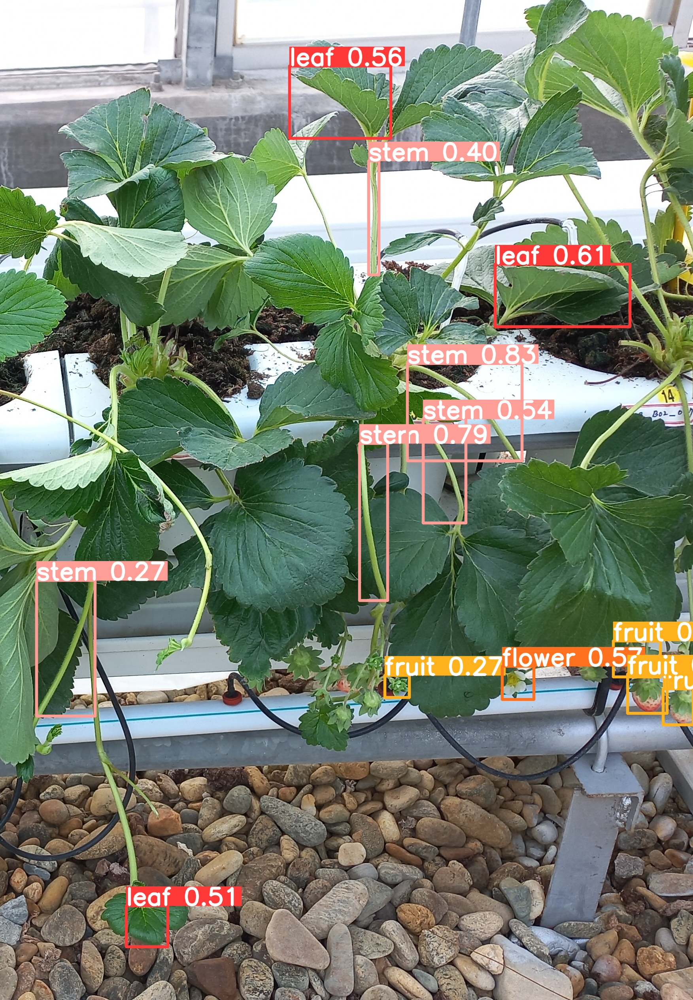

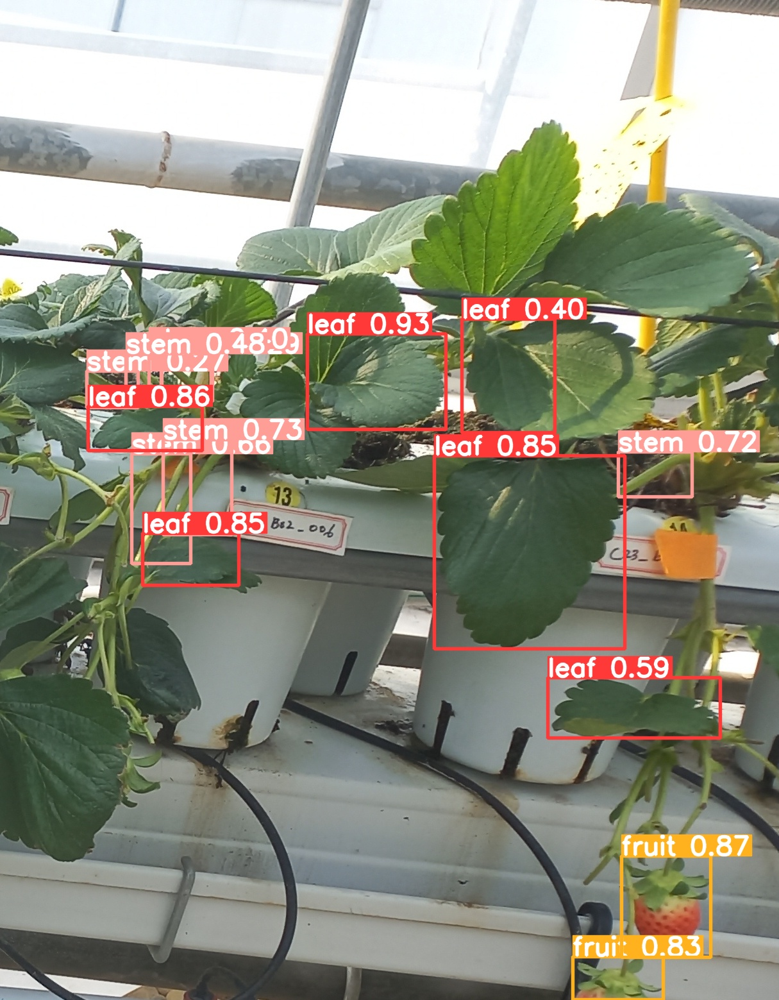

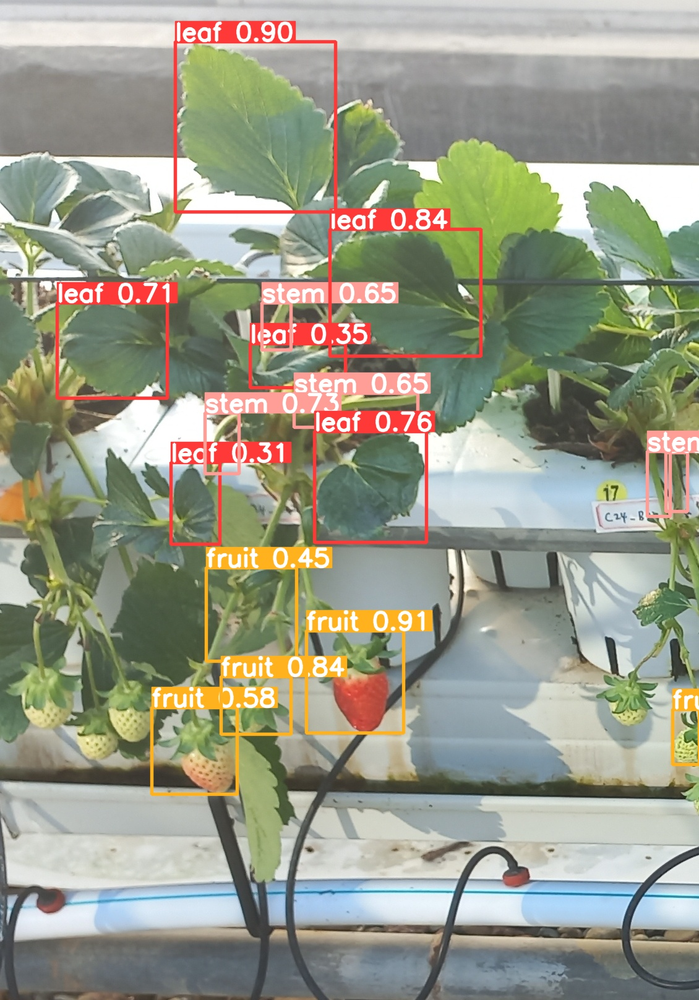

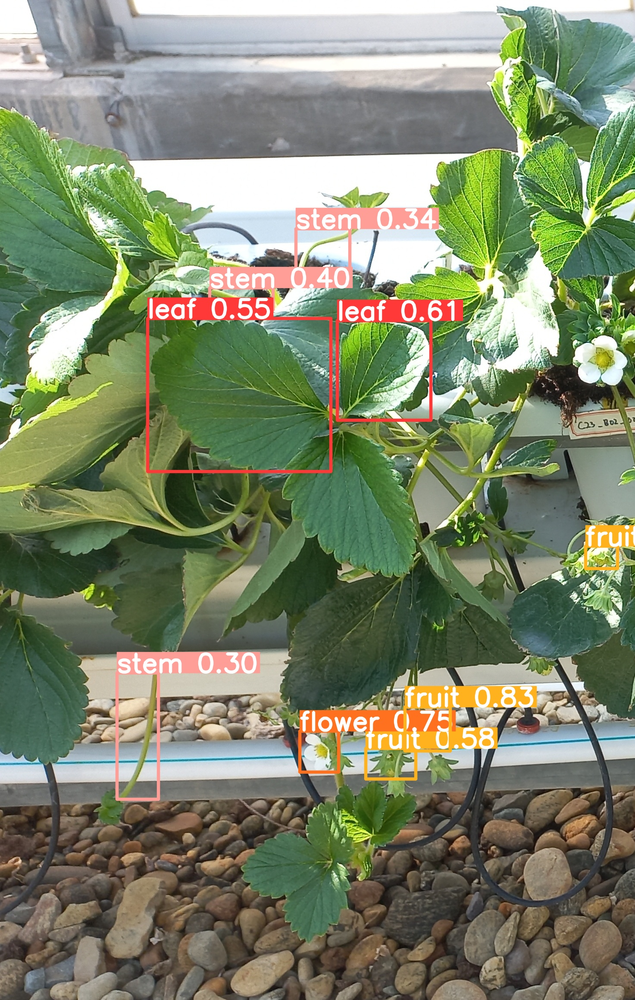

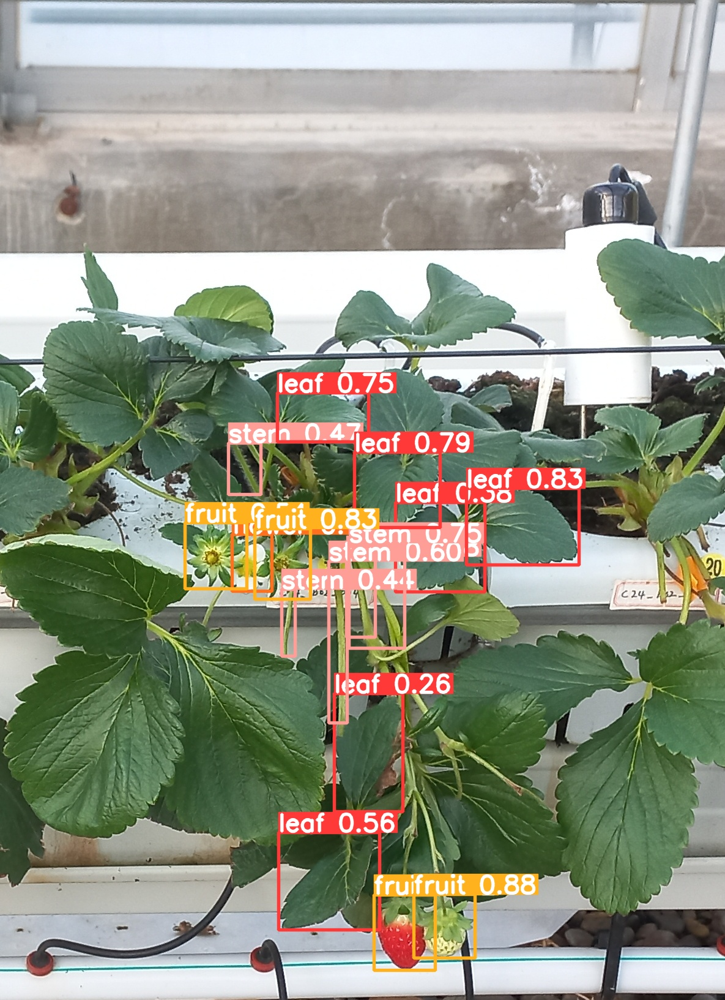

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:5]:
      display(Image(filename=image_path, height=600))
      print("\n")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/detect/train

<IPython.core.display.Javascript object>